In [1]:
import matplotlib.pyplot as plt
import numpy as np

import torch
from torch import nn, optim
from torchvision import datasets, transforms

import zipfile

import shutil
import os
import pandas as pd

device = ("cuda" if torch.cuda.is_available() else "cpu") # Use GPU or CPU for training

In [2]:
!mkdir data_faces && wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip

--2024-11-14 13:48:36--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.113.112, 52.219.193.128, 52.219.194.144, ...
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.113.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘celeba.zip’

celeba.zip          100%[===================>]   1.34G  56.2MB/s    in 26s     

2024-11-14 13:49:02 (53.8 MB/s) - ‘celeba.zip’ saved [1443490838/1443490838]



In [3]:
with zipfile.ZipFile("celeba.zip","r") as zip_ref:
  zip_ref.extractall("data_faces/")

In [4]:
root = 'data_faces/img_align_celeba'
img_list = os.listdir(root)
print(len(img_list))

202599


In [6]:
df = pd.read_csv("list_attr_celeba.csv")
df = df[['image_id', 'Smiling']]

In [7]:
!rm -rf data
!mkdir data && mkdir data/smile && mkdir data/no_smile

In [8]:
s0 = 0
s1 = 0

num = 1500

for i, (_, i_row) in enumerate(df.iterrows()):
  if s0 < num:
    if i_row['Smiling'] == 1:
      s0 += 1
      shutil.copyfile('data_faces/img_align_celeba/' + i_row['image_id'], 'data/smile/' + i_row['image_id'])

  if s1 < num:
    if i_row['Smiling'] == -1:
      s1 += 1
      shutil.copyfile('data_faces/img_align_celeba/' + i_row['image_id'], 'data/no_smile/' + i_row['image_id'])

  if s0 == num and s1 == num:
    break

In [9]:
img_list = os.listdir('data/smile/')
img_list.extend(os.listdir('data/no_smile/'))

In [10]:
print("Images: ", len(img_list))

Images:  3000


In [11]:
!rm -rf 'data/.ipynb_checkpoints/'

In [23]:


transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Изменение размера изображений до 64x64
    transforms.CenterCrop(64),            # Обрезка центра изображения
    transforms.ToTensor(),                        # Преобразование изображения в тензор
    transforms.Normalize([0.5 for _ in range(3)], [0.5 for _ in range(3)])  # Нормализация до диапазона [-1, 1]
])

batch_size = 128
celeba_data = datasets.ImageFolder('data', transform=transform)

In [24]:
print(celeba_data.classes)
print(len(celeba_data))

['no_smile', 'smile']
3000


In [25]:
train_set, test_set = torch.utils.data.random_split(celeba_data, [int(len(img_list) * 0.75), len(img_list) - int(len(img_list) * 0.75)])
train_data_size = len(train_set)
test_data_size = len(test_set)

In [26]:
train_loader = torch.utils.data.DataLoader(train_set,batch_size=batch_size, shuffle=True)
test_loader  = torch.utils.data.DataLoader(test_set, batch_size=batch_size, shuffle=True)

In [27]:
print(train_data_size)
print(test_data_size)

2250
750


Эпоха 1 [0/2250 (0%)]	Потеря: 7923.5015
====> Эпоха 1 Средняя потеря: 26149042608.3625
====> Тестовая потеря: 4165.1137


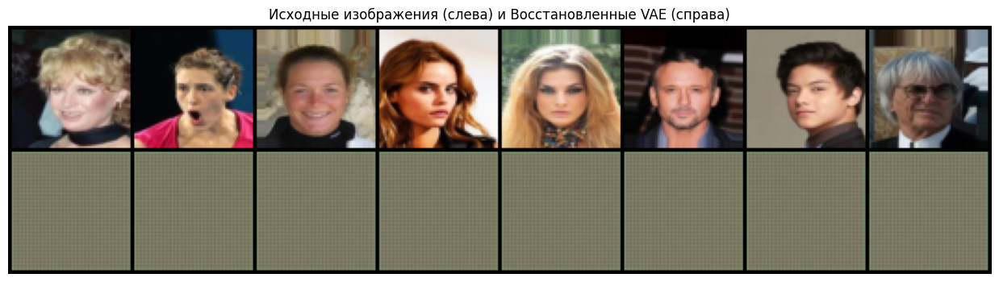

Эпоха 2 [0/2250 (0%)]	Потеря: 4054.2722
====> Эпоха 2 Средняя потеря: 3179.2548
====> Тестовая потеря: 5574.9893


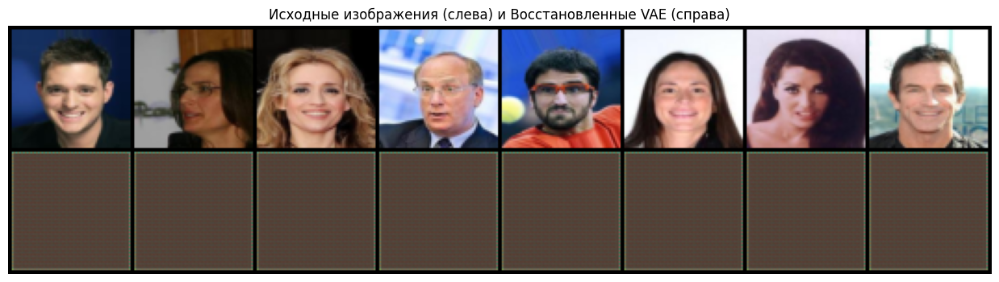

Эпоха 3 [0/2250 (0%)]	Потеря: 2442.9197
====> Эпоха 3 Средняя потеря: 2221.1401
====> Тестовая потеря: 8320.1731


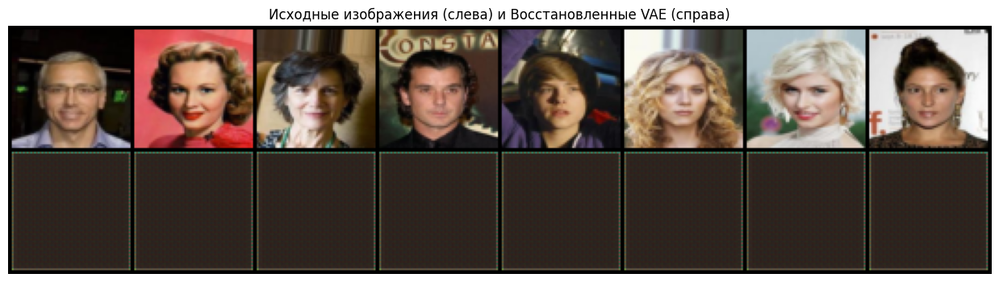

Эпоха 4 [0/2250 (0%)]	Потеря: 2033.8221
====> Эпоха 4 Средняя потеря: 1818.1631
====> Тестовая потеря: 10092.4698


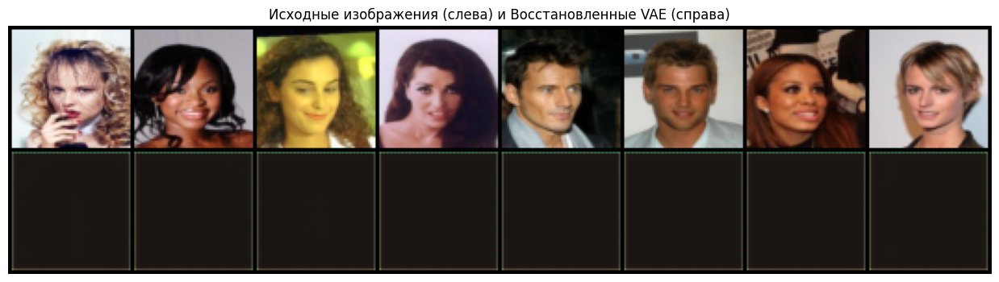

Эпоха 5 [0/2250 (0%)]	Потеря: 1669.1051
====> Эпоха 5 Средняя потеря: 1608.7701
====> Тестовая потеря: 10928.4393


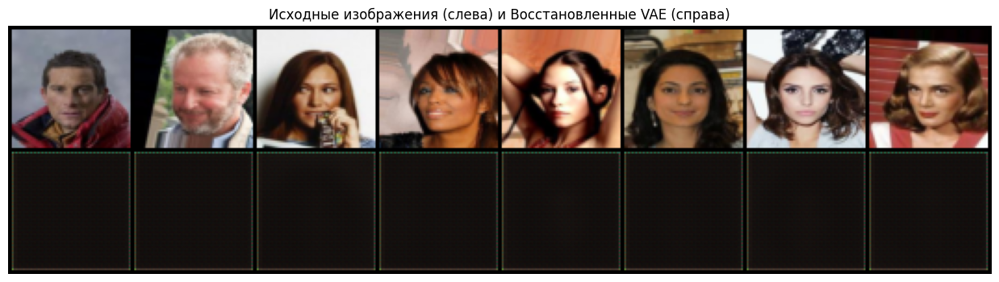

Эпоха 6 [0/2250 (0%)]	Потеря: 1491.5042
====> Эпоха 6 Средняя потеря: 1450.5994
====> Тестовая потеря: 11111.9692


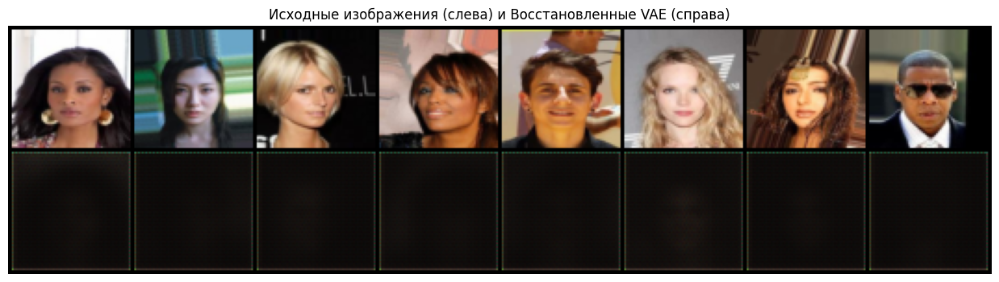

Эпоха 7 [0/2250 (0%)]	Потеря: 1329.4019
====> Эпоха 7 Средняя потеря: 1345.5364
====> Тестовая потеря: 9411.6688


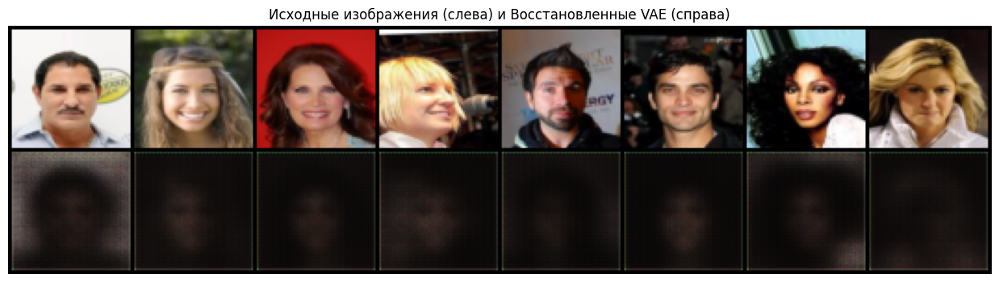

Эпоха 8 [0/2250 (0%)]	Потеря: 1308.3693
====> Эпоха 8 Средняя потеря: 1282.3569
====> Тестовая потеря: 4688.5623


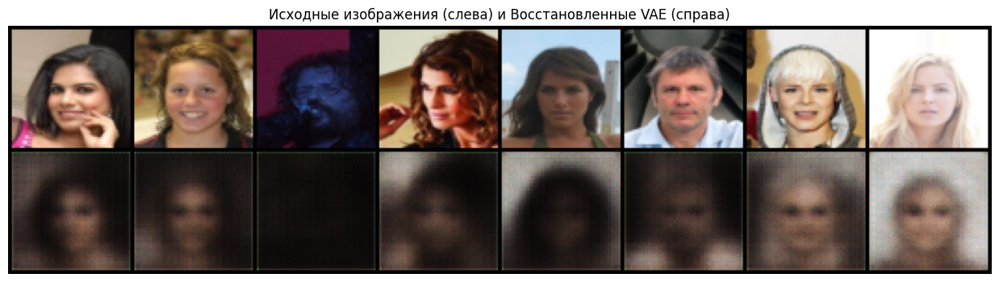

Эпоха 9 [0/2250 (0%)]	Потеря: 1217.6467
====> Эпоха 9 Средняя потеря: 1210.1922
====> Тестовая потеря: 1577.0988


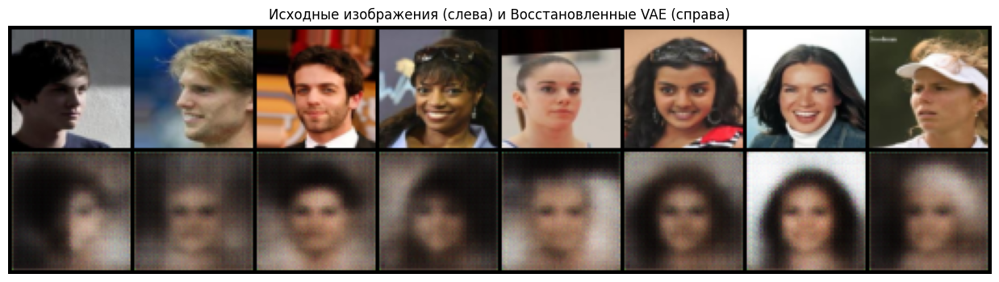

Эпоха 10 [0/2250 (0%)]	Потеря: 1231.6067
====> Эпоха 10 Средняя потеря: 1141.3995
====> Тестовая потеря: 1200.8569


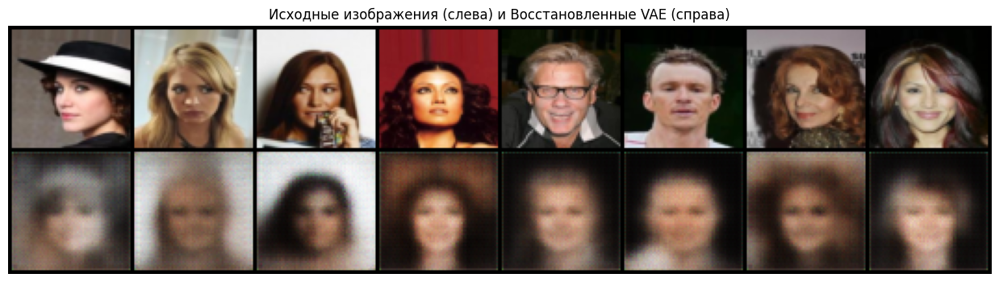

Эпоха 11 [0/2250 (0%)]	Потеря: 1129.8594
====> Эпоха 11 Средняя потеря: 1104.3144
====> Тестовая потеря: 1137.8633


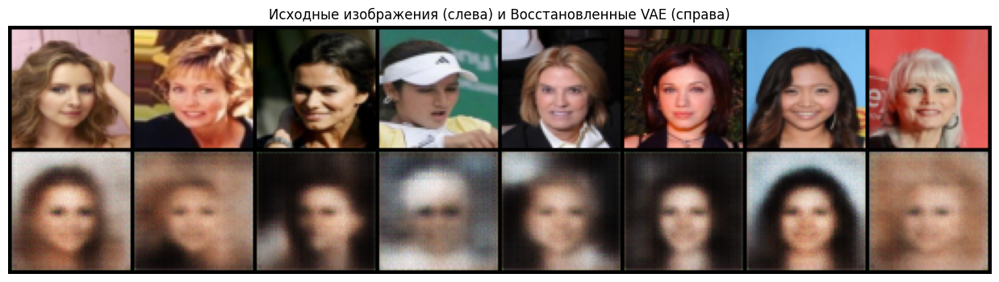

Эпоха 12 [0/2250 (0%)]	Потеря: 1085.9888
====> Эпоха 12 Средняя потеря: 1072.9102
====> Тестовая потеря: 1157.3534


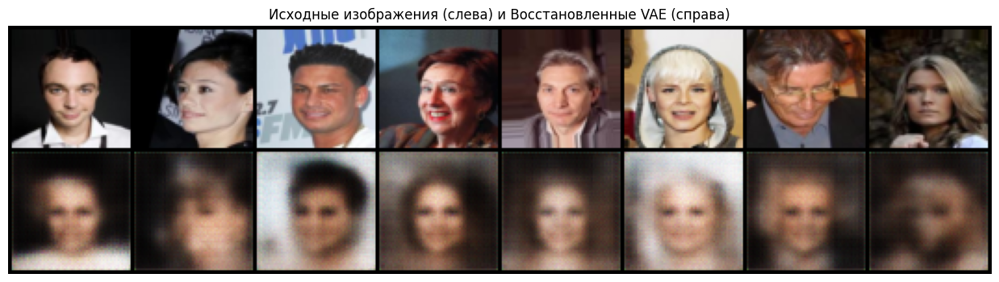

Эпоха 13 [0/2250 (0%)]	Потеря: 1081.8723
====> Эпоха 13 Средняя потеря: 1045.2135
====> Тестовая потеря: 1142.8481


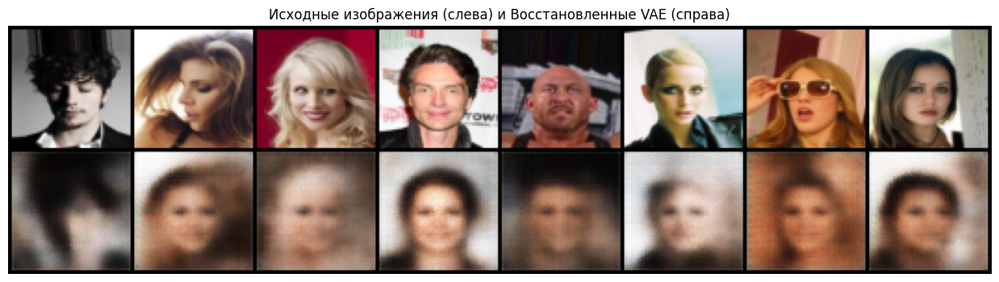

Эпоха 14 [0/2250 (0%)]	Потеря: 981.1344
====> Эпоха 14 Средняя потеря: 1014.6565
====> Тестовая потеря: 1094.0885


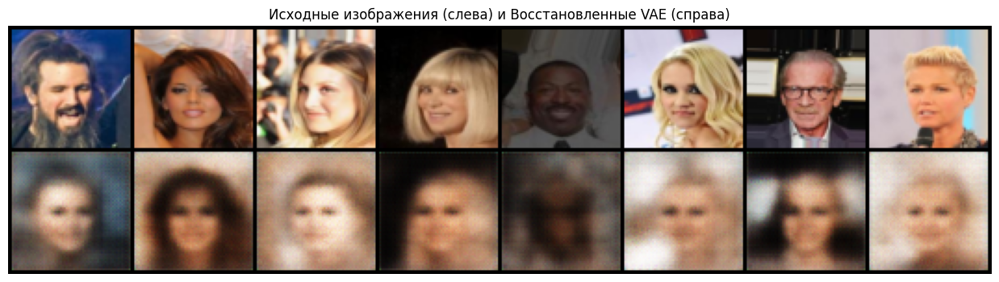

Эпоха 15 [0/2250 (0%)]	Потеря: 979.1758
====> Эпоха 15 Средняя потеря: 988.0042
====> Тестовая потеря: 1077.5333


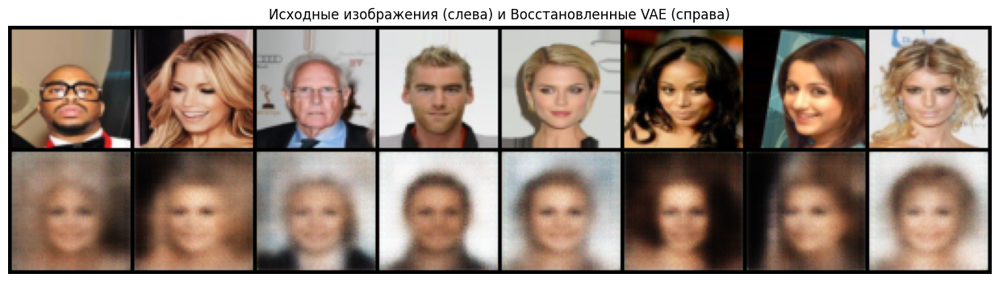

Эпоха 16 [0/2250 (0%)]	Потеря: 965.4845
====> Эпоха 16 Средняя потеря: 972.3833
====> Тестовая потеря: 1074.4622


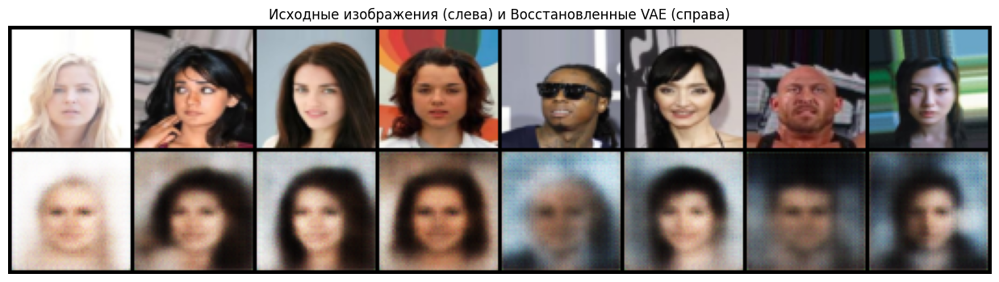

Эпоха 17 [0/2250 (0%)]	Потеря: 979.7543
====> Эпоха 17 Средняя потеря: 962.4576
====> Тестовая потеря: 1079.1386


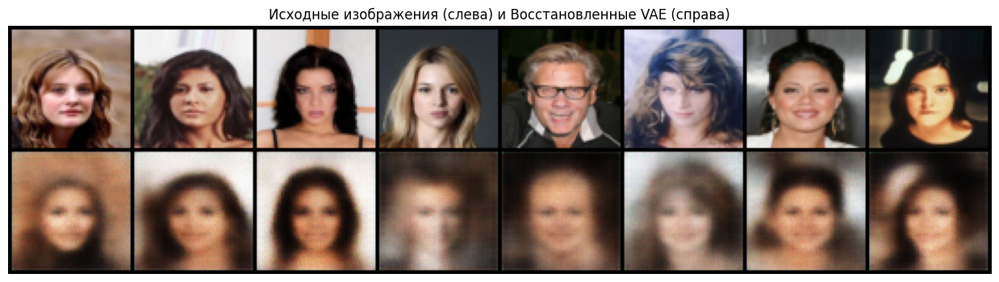

Эпоха 18 [0/2250 (0%)]	Потеря: 950.6500
====> Эпоха 18 Средняя потеря: 936.5118
====> Тестовая потеря: 1039.6630


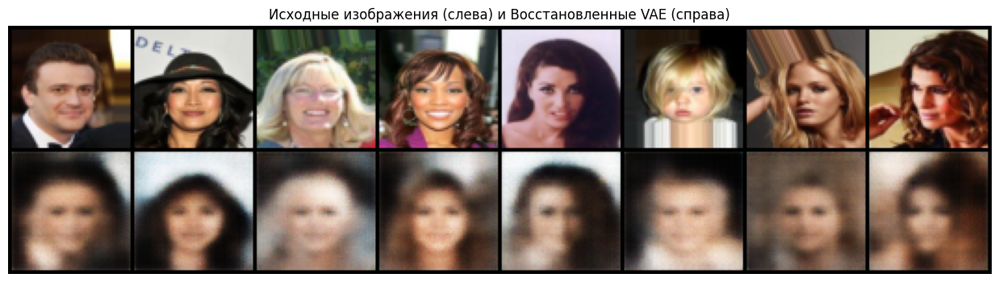

Эпоха 19 [0/2250 (0%)]	Потеря: 883.8207
====> Эпоха 19 Средняя потеря: 906.9703
====> Тестовая потеря: 1006.7738


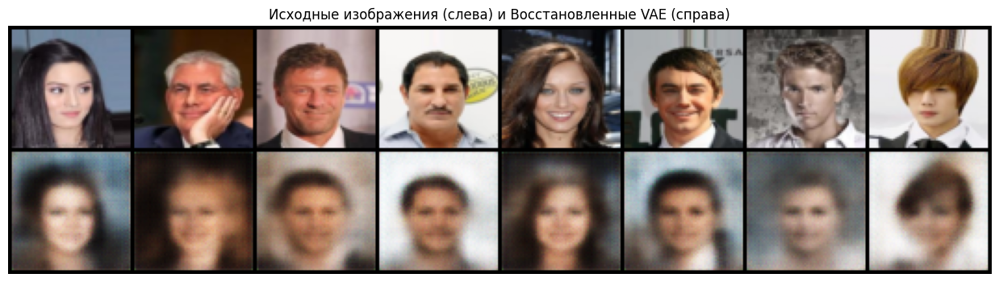

Эпоха 20 [0/2250 (0%)]	Потеря: 896.5942
====> Эпоха 20 Средняя потеря: 879.2934
====> Тестовая потеря: 1000.7618


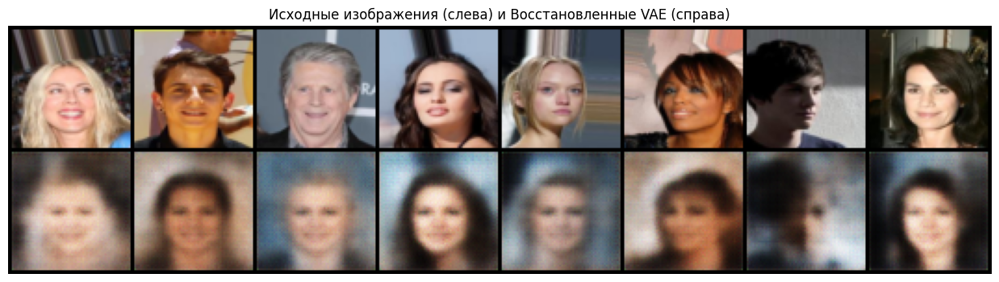

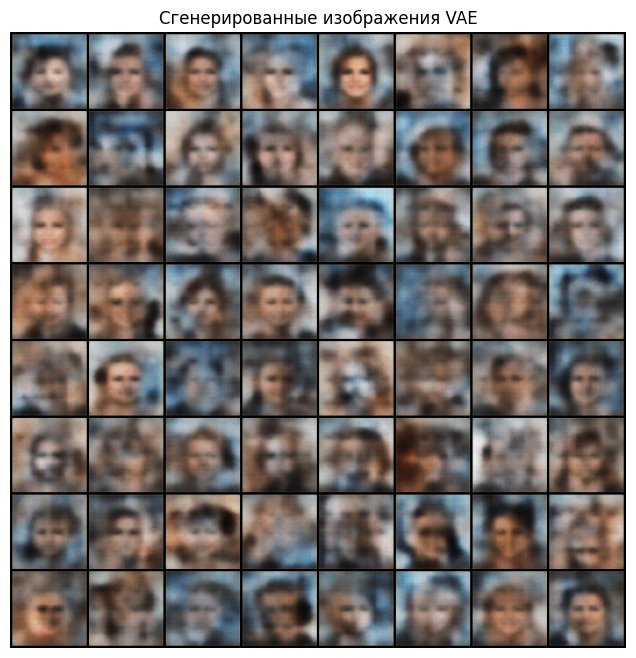

In [38]:
# Импорт необходимых библиотек
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torchvision import datasets, transforms, utils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
# Параметры модели
batch_size = 128
latent_dim = 100  # Размер латентного пространства
epochs = 20
learning_rate = 1e-3
image_size = 64    # Размер изображений (64x64)
num_workers = 4    # Количество рабочих процессов для загрузки данных
# Определение архитектуры сверточного вариационного автоэнкодера (ConvVAE)
class ConvVAE(nn.Module):
    def __init__(self, latent_dim=100):
        super(ConvVAE, self).__init__()
        self.latent_dim = latent_dim

        # Энкодер
        self.encoder = nn.Sequential(
            # Вход: [B, 3, 64, 64]
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),   # [B, 32, 32, 32]
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # [B, 64, 16, 16]
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), # [B, 128, 8, 8]
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),# [B, 256, 4, 4]
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.Flatten()  # [B, 256*4*4=4096]
        )

        # Линейные слои для получения mu и logvar
        self.fc_mu = nn.Linear(256*4*4, latent_dim)
        self.fc_logvar = nn.Linear(256*4*4, latent_dim)

        # Линейный слой для декодера
        self.decoder_fc = nn.Sequential(
            nn.Linear(latent_dim, 256*4*4),
            nn.ReLU(True)
        )

        # Декодер
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), # [B, 128, 8, 8]
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # [B, 64, 16, 16]
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),   # [B, 32, 32, 32]
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),    # [B, 3, 64, 64]
            nn.Tanh()  # Выходные значения в диапазоне [-1, 1]
        )

    def encode(self, x):
        h = self.encoder(x)  # [B, 4096]
        mu = self.fc_mu(h)   # [B, latent_dim]
        logvar = self.fc_logvar(h)  # [B, latent_dim]
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)  # Стандартное отклонение
        eps = torch.randn_like(std)    # Случайный шум
        return mu + eps * std          # Вектор латентного пространства

    def decode(self, z):
        h = self.decoder_fc(z)        # [B, 256*4*4]
        h = h.view(-1, 256, 4, 4)     # [B, 256, 4, 4]
        recon_x = self.decoder(h)     # [B, 3, 64, 64]
        return recon_x

    def forward(self, x):
        mu, logvar = self.encode(x)   # Получение параметров распределения
        z = self.reparameterize(mu, logvar)  # Пробуждение
        recon_x = self.decode(z)       # Восстановление изображения
        return recon_x, mu, logvar

# Функция потерь для VAE
def loss_function(recon_x, x, mu, logvar):
    # BCE потеря: поэлементная бинарная кросс-энтропия
    BCE = F.mse_loss(recon_x, x, reduction='sum')

    # Kullback-Leibler дивергенция
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return BCE + KLD

# Инициализация модели и оптимизатора
model = ConvVAE(latent_dim=latent_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Функция обучения
def train(epoch):
    model.train()
    train_loss = 0
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

        if batch_idx % 100 == 0:
            print(f"Эпоха {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} "
                  f"({100. * batch_idx / len(train_loader):.0f}%)]\tПотеря: {loss.item() / len(data):.4f}")

    average_loss = train_loss / len(train_loader.dataset)
    print(f"====> Эпоха {epoch} Средняя потеря: {average_loss:.4f}")

# Функция тестирования
def test(epoch):
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for data, _ in test_loader:
            data = data.to(device)
            recon, mu, logvar = model(data)
            test_loss += loss_function(recon, data, mu, logvar).item()

    average_loss = test_loss / len(test_loader.dataset)
    print(f"====> Тестовая потеря: {average_loss:.4f}")

# Функция для визуализации восстановленных изображений
def visualize_reconstructions():
    model.eval()
    with torch.no_grad():
        data, _ = next(iter(test_loader))
        data = data.to(device)
        recon, _, _ = model(data)

        # Отмена нормализации для отображения
        data = data * 0.5 + 0.5
        recon = recon * 0.5 + 0.5

        # Выбор первых 8 изображений
        n = 8
        comparison = torch.cat([data[:n], recon[:n]])
        grid_img = utils.make_grid(comparison, nrow=n)

        plt.figure(figsize=(16, 4))
        plt.imshow(grid_img.permute(1, 2, 0).cpu().numpy())
        plt.title("Исходные изображения (слева) и Восстановленные VAE (справа)")
        plt.axis('off')
        plt.show()

# Функция для генерации новых изображений из латентного пространства
def generate_images():
    model.eval()
    with torch.no_grad():
        # Генерация случайных векторов из нормального распределения
        z = torch.randn(64, latent_dim).to(device)
        sample = model.decode(z).cpu()

        # Отмена нормализации для отображения
        sample = sample * 0.5 + 0.5

        grid_img = utils.make_grid(sample, nrow=8)
        plt.figure(figsize=(8, 8))
        plt.imshow(grid_img.permute(1, 2, 0).numpy())
        plt.title("Сгенерированные изображения VAE")
        plt.axis('off')
        plt.show()

# Основной цикл обучения и тестирования
for epoch in range(1, epochs + 1):
    train(epoch)
    test(epoch)
    visualize_reconstructions()

# Визуализация сгенерированных изображений после обучения
generate_images()









